### This notebook is used to fit the datasets from SDGym using Max's KDE copula model.
* First, remove the categorical features and try to fit the model only for numerical features
* Second, one-hot encode the categorical features and try to fit KDE copula on that

In [ ]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
from sdgym import load_dataset
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPClassifier
from pandas_profiling import ProfileReport
%matplotlib inline

In [3]:
from src.models.kde_copula_nn_pdf import KDECopulaNNPdf
from src.models.kde_utils import kde_smooth_peaks_1dim, kde_smooth_peaks

#### Load the datasets

In [54]:
df, categorical_columns, ordinal_columns = load_dataset('adult')

In [5]:
explore_df = pd.DataFrame(df)
profile = ProfileReport(explore_df, title="EDA for adult dataset")

In [6]:
profile

In [7]:
all_features = list(range(df.shape[1]))
numerical_features = list(set(all_features) - set(categorical_columns + ordinal_columns))
data = df[:, numerical_features]
## Conversion is needed to successfully fit KDECopulaNNPdf
data = np.float64(data)
n_samples = data.shape[0]
n_features = data.shape[1]

#### Set model parameters

In [8]:
def set_min_max(data):
    x_min = [0] * n_features
    x_max = [1.] * n_features
    for i in range(0, n_features):
        x_min[i] = data[:, i].min()
        x_max[i] = data[:, i].max()
    return x_min, x_max

In [9]:
x_min, x_max = set_min_max(data)
print(x_min, x_max)
print(np.sum(np.isinf(data).any()))
print(np.sum(np.isnan(data).any()))

[17.0, 12285.0, 1.0, 0.0, 0.0, 1.0] [90.0, 1484705.0, 16.0, 99999.0, 4356.0, 99.0]
0
0


#### Fit KDECopulaNNPdf model on numerical features only

In [10]:
kde = KDECopulaNNPdf(x_min=x_min, x_max=x_max, rho=0.5, clf=MLPClassifier(random_state=0, max_iter=500, early_stopping=True))

In [11]:
kde = kde.fit(data)

Transforming variables.
Fitting and calibrating classifier.
Model = rho: 0.5, number of selected non-linear variables: 6


(array([1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 3.300e+01, 4.700e+01,
        6.200e+01, 1.070e+02, 1.690e+02, 2.710e+02, 3.930e+02, 5.620e+02,
        7.460e+02, 9.800e+02, 1.207e+03, 1.429e+03, 1.635e+03, 1.787e+03,
        1.847e+03, 1.864e+03, 1.779e+03, 1.634e+03, 1.433e+03, 1.216e+03,
        9.700e+02, 7.500e+02, 5.540e+02, 3.950e+02, 2.720e+02, 1.690e+02,
        1.080e+02, 5.900e+01, 4.200e+01, 2.000e+01, 4.000e+00, 4.000e+00,
        2.000e+00, 0.000e+00, 2.000e+00, 1.000e+00, 0.000e+00, 1.000e+00,
        1.000e+00, 4.000e+00]),
 array([-5.19933758e+00, -4.99136408e+00, -4.78339058e+00, -4.57541707e+00,
        -4.36744357e+00, -4.15947007e+00, -3.95149656e+00, -3.74352306e+00,
        -3.53554956e+00, -3.32757605e+00, -3.11960255e+00, -2.91162905e+00,
        -2.70365554e+00, -2.49568204e+00, -2.28770854e+00, -2.07973503e+00,
        -1.87176153e+00, -1.66378803e+00, -1.45581452e+00, -1.24784102e+

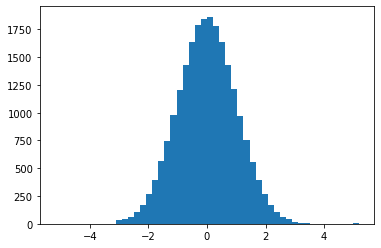

In [12]:
X_g = kde.pipe_[0].transform(data)
plt.hist(X_g[:, 1], bins=50)

(array([3.000e+00, 0.000e+00, 1.000e+00, 1.000e+00, 1.000e+00, 8.000e+00,
        1.000e+01, 1.500e+01, 1.500e+01, 4.200e+01, 4.600e+01, 7.300e+01,
        8.100e+01, 1.260e+02, 1.610e+02, 2.560e+02, 3.500e+02, 5.060e+02,
        7.030e+02, 9.360e+02, 1.295e+03, 1.560e+03, 1.852e+03, 1.883e+03,
        2.057e+03, 1.966e+03, 1.795e+03, 1.689e+03, 1.355e+03, 1.039e+03,
        7.850e+02, 5.640e+02, 3.990e+02, 2.410e+02, 1.930e+02, 1.260e+02,
        8.000e+01, 6.100e+01, 5.600e+01, 4.500e+01, 2.500e+01, 3.600e+01,
        3.800e+01, 4.000e+01, 1.900e+01, 9.000e+00, 9.000e+00, 5.000e+00,
        2.000e+00, 3.000e+00]),
 array([-6.19634158, -5.94574764, -5.6951537 , -5.44455976, -5.19396582,
        -4.94337188, -4.69277794, -4.442184  , -4.19159006, -3.94099612,
        -3.69040218, -3.43980824, -3.18921429, -2.93862035, -2.68802641,
        -2.43743247, -2.18683853, -1.93624459, -1.68565065, -1.43505671,
        -1.18446277, -0.93386883, -0.68327489, -0.43268095, -0.18208701,
         0.

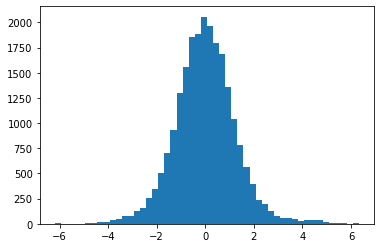

In [13]:
X_p = kde.pipe_[0:2].transform(data)
plt.hist(X_p[:, 0], bins=50)

(array([450., 453., 452., 449., 451., 450., 455., 451., 451., 447., 455.,
        451., 450., 452., 457., 449., 445., 459., 444., 454., 447., 457.,
        448., 451., 456., 454., 447., 450., 445., 454., 451., 454., 451.,
        451., 452., 452., 454., 445., 455., 453., 448., 451., 449., 456.,
        450., 450., 452., 453., 449., 451.]),
 array([8.87828783e-16, 2.00000000e-02, 4.00000000e-02, 6.00000000e-02,
        8.00000000e-02, 1.00000000e-01, 1.20000000e-01, 1.40000000e-01,
        1.60000000e-01, 1.80000000e-01, 2.00000000e-01, 2.20000000e-01,
        2.40000000e-01, 2.60000000e-01, 2.80000000e-01, 3.00000000e-01,
        3.20000000e-01, 3.40000000e-01, 3.60000000e-01, 3.80000000e-01,
        4.00000000e-01, 4.20000000e-01, 4.40000000e-01, 4.60000000e-01,
        4.80000000e-01, 5.00000000e-01, 5.20000000e-01, 5.40000000e-01,
        5.60000000e-01, 5.80000000e-01, 6.00000000e-01, 6.20000000e-01,
        6.40000000e-01, 6.60000000e-01, 6.80000000e-01, 7.00000000e-01,
        7.

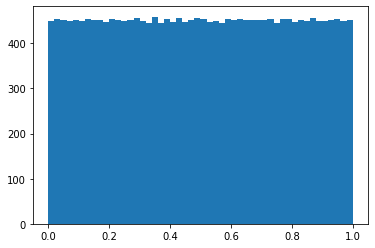

In [14]:
X_u = kde.pipe_.transform(data)
plt.hist(X_u[:, 1], bins=50)

In [15]:
# after transformations: pca and uniform datasets
pf = pd.DataFrame(X_p)
df = pd.DataFrame(X_u)

In [16]:
import phik

In [17]:
pf.corr()

,0,1,2,3,4,5
0,1.000000e+00,5.175425e-17,-9.433912e-17,-5.817685e-18,1.935684e-16,1.263231e-17
1,5.175425e-17,1.000000e+00,-4.416834e-16,-6.126160e-17,-1.893922e-16,-2.900905e-16
2,-9.433912e-17,-4.416834e-16,1.000000e+00,-1.056229e-16,-1.660773e-17,6.290866e-16
3,-5.817685e-18,-6.126160e-17,-1.056229e-16,1.000000e+00,5.449559e-16,9.885057e-17
4,1.935684e-16,-1.893922e-16,-1.660773e-17,5.449559e-16,1.000000e+00,2.787468e-16
5,1.263231e-17,-2.900905e-16,6.290866e-16,9.885057e-17,2.787468e-16,1.000000e+00


In [18]:
pf.phik_matrix()

interval columns not set, guessing: [0, 1, 2, 3, 4, 5]


,0,1,2,3,4,5
0,1.000000,0.536163,0.590295,0.327630,0.135315,0.237145
1,0.536163,1.000000,0.228794,0.235637,0.038148,0.093065
2,0.590295,0.228794,1.000000,0.141184,0.132999,0.319486
3,0.327630,0.235637,0.141184,1.000000,0.118909,0.066280
4,0.135315,0.038148,0.132999,0.118909,1.000000,0.280739
5,0.237145,0.093065,0.319486,0.066280,0.280739,1.000000


In [19]:
df.corr()

,0,1,2,3,4,5
0,1.000000,0.057276,0.057389,0.005196,0.010512,-0.051172
1,0.057276,1.000000,0.022904,-0.004833,0.014417,-0.009291
2,0.057389,0.022904,1.000000,0.016473,0.013907,-0.031410
3,0.005196,-0.004833,0.016473,1.000000,0.004418,-0.007998
4,0.010512,0.014417,0.013907,0.004418,1.000000,-0.022779
5,-0.051172,-0.009291,-0.031410,-0.007998,-0.022779,1.000000


In [20]:
df.phik_matrix()

interval columns not set, guessing: [0, 1, 2, 3, 4, 5]


,0,1,2,3,4,5
0,1.000000,0.165957,0.220609,0.091860,0.080286,0.119099
1,0.165957,1.000000,0.089284,0.040361,0.042011,0.026293
2,0.220609,0.089284,1.000000,0.052858,0.068143,0.244730
3,0.091860,0.040361,0.052858,1.000000,0.040783,0.035999
4,0.080286,0.042011,0.068143,0.040783,1.000000,0.074763
5,0.119099,0.026293,0.244730,0.035999,0.074763,1.000000


In [21]:
df.significance_matrix()

interval columns not set, guessing: [0, 1, 2, 3, 4, 5]


,0,1,2,3,4,5
0,321.272389,18.591834,27.431823,8.324457,6.695167,12.491374
1,18.591834,321.273804,8.301977,2.242864,2.412228,1.021475
2,27.431823,8.301977,321.278266,3.541808,5.520031,31.229221
3,8.324457,2.242864,3.541808,321.282894,2.313464,1.825121
4,6.695167,2.412228,5.520031,2.313464,321.268914,6.320296
5,12.491374,1.021475,31.229221,1.825121,6.320296,321.285400


In [22]:
# use mutual information to capture residual levels of non-linearity
from sklearn.feature_selection import mutual_info_regression
mi = np.zeros((data.shape[-1], data.shape[-1]))
for i in range(data.shape[-1]):
    mi[i, :] = mutual_info_regression(X_u, X_u[:, i])

mi

array([[8.76781604e+00, 9.97976151e-02, 8.96620685e-02, 1.23751074e-02,
        1.00410483e-02, 2.35388973e-02],
       [9.97976959e-02, 8.76773699e+00, 1.49034537e-02, 1.70070484e-02,
        0.00000000e+00, 0.00000000e+00],
       [8.96621756e-02, 1.49034537e-02, 8.76781604e+00, 8.52179030e-03,
        3.85038721e-03, 5.22412997e-02],
       [1.23749620e-02, 1.70068285e-02, 8.52152167e-03, 8.76766122e+00,
        3.61211085e-03, 7.49484627e-05],
       [1.00410483e-02, 0.00000000e+00, 3.85130647e-03, 3.61211085e-03,
        8.76782343e+00, 6.15673221e-03],
       [2.35389267e-02, 0.00000000e+00, 5.22412997e-02, 7.59307558e-05,
        6.15586094e-03, 8.76761879e+00]])

In [23]:
X_gen, sample_weight = kde.sample(n_samples)

In [24]:
sum(sample_weight)

22920.073182080883

(array([3.070e+02, 6.480e+02, 1.104e+03, 2.221e+03, 3.454e+03, 4.084e+03,
        3.946e+03, 2.876e+03, 1.512e+03, 8.800e+02, 5.190e+02, 2.980e+02,
        1.920e+02, 1.120e+02, 8.300e+01, 4.900e+01, 3.200e+01, 3.400e+01,
        2.200e+01, 1.400e+01, 1.400e+01, 1.400e+01, 1.200e+01, 8.000e+00,
        1.100e+01, 9.000e+00, 1.700e+01, 7.000e+00, 4.000e+00, 8.000e+00,
        8.000e+00, 4.000e+00, 9.000e+00, 6.000e+00, 7.000e+00, 4.000e+00,
        3.000e+00, 4.000e+00, 4.000e+00, 2.000e+00, 7.000e+00, 2.000e+00,
        2.000e+00, 2.000e+00, 0.000e+00, 1.000e+00, 2.000e+00, 1.000e+00,
        0.000e+00, 2.000e+00]),
 array([0.10128555, 0.24884066, 0.39639576, 0.54395087, 0.69150597,
        0.83906107, 0.98661618, 1.13417128, 1.28172638, 1.42928149,
        1.57683659, 1.72439169, 1.8719468 , 2.0195019 , 2.167057  ,
        2.31461211, 2.46216721, 2.60972231, 2.75727742, 2.90483252,
        3.05238762, 3.19994273, 3.34749783, 3.49505293, 3.64260804,
        3.79016314, 3.93771824, 4.08

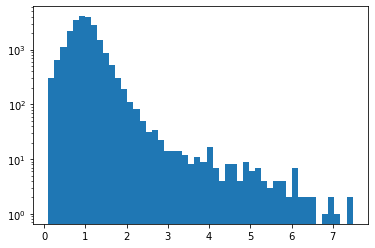

In [25]:
plt.hist(sample_weight, bins=50, log=True)

In [26]:
def print_range(idx):
    print(X_gen[:, idx].min(), X_gen[:, idx].max())
    print(data[:, idx].min(), data[:, idx].max())

In [27]:
print_range(1)

12300.446430557256 1073012.639322921
12285.0 1484705.0


(array([6.32162386e-07, 3.01029708e-06, 2.08613587e-06, 1.64964280e-06,
        1.91755924e-06, 2.58584519e-06, 4.19936442e-06, 4.18130264e-06,
        3.41969748e-06, 3.69965511e-06, 4.81948562e-06, 5.69548207e-06,
        5.25597869e-06, 3.88328323e-06, 3.02233826e-06, 2.50155687e-06,
        1.99582696e-06, 1.69178696e-06, 1.72490022e-06, 1.30345863e-06,
        1.25529388e-06, 1.11682022e-06, 1.28840715e-06, 8.51914072e-07,
        7.46553675e-07, 5.80987336e-07, 5.41853474e-07, 4.27462185e-07,
        2.61895846e-07, 2.40823766e-07, 1.86638419e-07, 1.80617825e-07,
        1.17401586e-07, 1.26432477e-07, 9.03089123e-08, 6.92368327e-08,
        9.33192093e-08, 6.32162386e-08, 3.91338620e-08, 4.51544561e-08,
        4.51544561e-08, 9.03089123e-09, 2.10720795e-08, 3.01029708e-08,
        3.01029708e-08, 1.20411883e-08, 2.70926737e-08, 1.80617825e-08,
        9.03089123e-09, 2.40823766e-08, 1.80617825e-08, 0.00000000e+00,
        0.00000000e+00, 9.03089123e-09, 6.02059415e-09, 0.000000

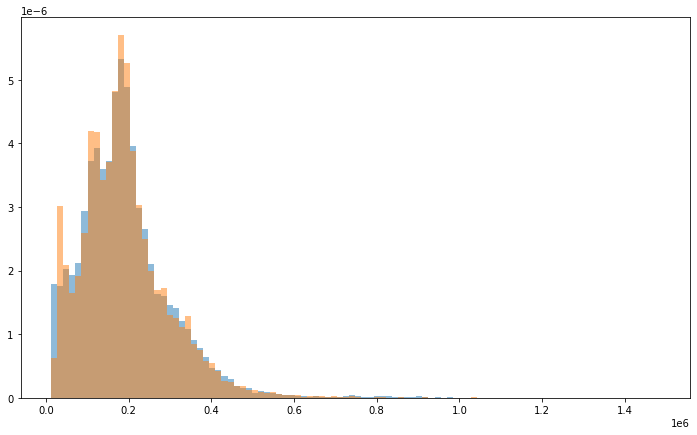

In [28]:
i=1
plt.figure(figsize=(12, 7))
plt.hist(X_gen[:, i], bins=100, range=(x_min[i]-1, x_max[i]+1), density=True, alpha=0.5, weights=sample_weight)
plt.hist(data[:, i], bins=100, range=(x_min[i]-1, x_max[i]+1), density=True, alpha=0.5)

In [29]:
print_range(0)

17.000315073428975 89.99857262255735
17.0 90.0


(array([0.00000000e+00, 1.61931356e-02, 2.27531286e-02, 0.00000000e+00,
        2.84857350e-02, 3.12042906e-02, 3.11451916e-02, 0.00000000e+00,
        3.29772616e-02, 3.59322134e-02, 3.34500539e-02, 0.00000000e+00,
        3.46911337e-02, 3.03178051e-02, 3.52230250e-02, 0.00000000e+00,
        3.68186989e-02, 3.35091530e-02, 3.39819452e-02, 0.00000000e+00,
        3.71732931e-02, 3.27999645e-02, 3.52821240e-02, 0.00000000e+00,
        3.64050057e-02, 3.47502327e-02, 3.74096893e-02, 0.00000000e+00,
        3.48093317e-02, 3.37455491e-02, 3.25044694e-02, 0.00000000e+00,
        3.25635684e-02, 3.31545588e-02, 3.17361819e-02, 0.00000000e+00,
        3.23862713e-02, 3.04360031e-02, 3.06133002e-02, 0.00000000e+00,
        2.94904186e-02, 2.83084379e-02, 2.30486237e-02, 0.00000000e+00,
        2.30486237e-02, 2.41124064e-02, 2.46442977e-02, 0.00000000e+00,
        1.92662855e-02, 1.88525922e-02, 1.70205221e-02, 0.00000000e+00,
        1.60749376e-02, 1.52475511e-02, 1.49520559e-02, 0.000000

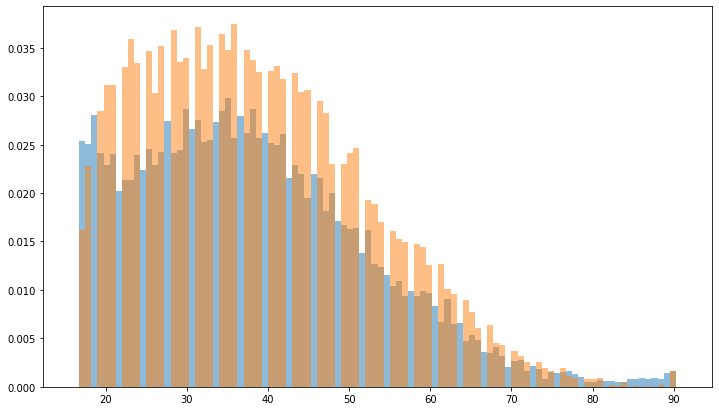

In [30]:
i=0
plt.figure(figsize=(12, 7))
plt.hist(X_gen[:, i], bins=100, range=(x_min[i]-1, x_max[i]+1), density=True, alpha=0.5, weights=sample_weight)
plt.hist(data[:, i], bins=100, range=(x_min[i]-1, x_max[i]+1), density=True, alpha=0.5)

In [31]:
kde.score(data)

/Users/lorrainedalmeida/Work/Experiment_Week/synthsonic/env/lib/python3.8/site-packages/scipy/interpolate/interpolate.py:605: RuntimeWarning: divide by zero encountered in true_divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]


-727054.7372205692

#### Fit KDECopulaNNPdf model on categorical and ordinal(integer encoded) features

In [45]:
df, categorical_columns, ordinal_columns = load_dataset('adult')
data = df[:, categorical_columns+ordinal_columns]
data = np.float64(data)
n_samples = data.shape[0]
n_features = data.shape[1]

In [46]:
x_min, x_max = set_min_max(data)
print(x_min, x_max)
print(np.sum(np.isinf(data).any()))
print(np.sum(np.isnan(data).any()))

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0] [8.0, 6.0, 14.0, 5.0, 4.0, 1.0, 40.0, 1.0, 15.0]
0
0


In [47]:
kde = KDECopulaNNPdf(x_min=x_min, x_max=x_max, rho=0.5, clf=MLPClassifier(random_state=0, max_iter=500, early_stopping=True))

In [48]:
kde = kde.fit(data)

Transforming variables.
Fitting and calibrating classifier.
Model = rho: 0.5, number of selected non-linear variables: 9


In [49]:
X_gen, sample_weight = kde.sample(n_samples)

(array([1.3935e+04, 2.2830e+03, 1.3250e+03, 9.3400e+02, 6.4600e+02,
        5.6600e+02, 4.6200e+02, 3.6300e+02, 3.1500e+02, 2.6200e+02,
        2.1300e+02, 1.5800e+02, 1.6000e+02, 1.2300e+02, 1.0900e+02,
        1.0300e+02, 7.9000e+01, 6.8000e+01, 5.1000e+01, 5.1000e+01,
        3.4000e+01, 4.6000e+01, 2.2000e+01, 2.2000e+01, 2.6000e+01,
        2.4000e+01, 2.5000e+01, 2.0000e+01, 1.9000e+01, 1.6000e+01,
        1.2000e+01, 8.0000e+00, 9.0000e+00, 1.2000e+01, 5.0000e+00,
        1.1000e+01, 6.0000e+00, 1.0000e+01, 8.0000e+00, 5.0000e+00,
        5.0000e+00, 2.0000e+00, 2.0000e+00, 1.0000e+00, 1.0000e+00,
        1.0000e+00, 1.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([ 0.02920476,  0.46116551,  0.89312627,  1.32508703,  1.75704778,
         2.18900854,  2.6209693 ,  3.05293005,  3.48489081,  3.91685156,
         4.34881232,  4.78077308,  5.21273383,  5.64469459,  6.07665535,
         6.5086161 ,  6.94057686,  7.37253762,  7.80449837,  8.23645913,
         8.66841988,  9.10

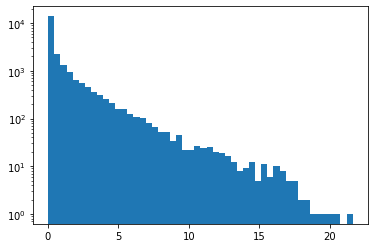

In [50]:
plt.hist(sample_weight, bins=50, log=True)

In [51]:
print_range(0)

1.5426687788853327e-10 7.990979967450791
0.0 8.0


(array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 6.93453304e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        7.92961305e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 6.48020921e-01, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        5.73999379e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 4.09556314e-01, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.000000

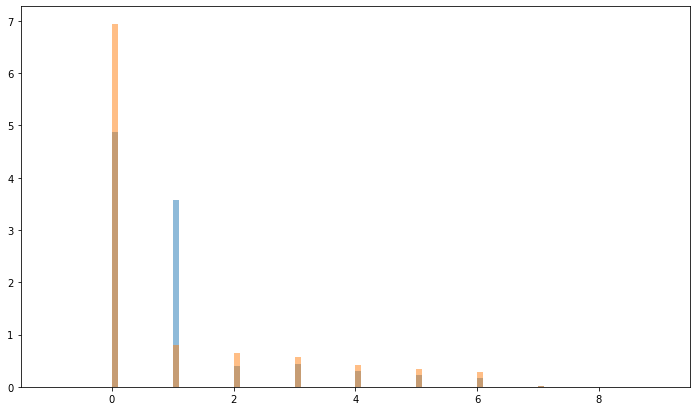

In [52]:
i=0
plt.figure(figsize=(12, 7))
plt.hist(np.rint(X_gen[:, i]), bins=100, range=(x_min[i]-1, x_max[i]+1), density=True, alpha=0.5, weights=sample_weight)
plt.hist(data[:, i], bins=100, range=(x_min[i]-1, x_max[i]+1), density=True, alpha=0.5)

In [53]:
kde.score(data)

/Users/lorrainedalmeida/Work/Experiment_Week/synthsonic/env/lib/python3.8/site-packages/scipy/interpolate/interpolate.py:605: RuntimeWarning: divide by zero encountered in true_divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]


204589.09573304595